# Figure 3 - Deconvolution of Renal Ischemic Kidney

Pip installation of required packages

In [1]:
#%%capture
#!pip install scanpy adjustText progressbar2 more_itertools leidenalg

In [13]:
%reload_ext autoreload
%autoreload 2
%timeit

# Add repo path to system path if it is not already there
# This allows us to import the package
import sys
GIT_REPO_PATH = "/home/jupyter/github_repos/"
if GIT_REPO_PATH not in sys.path: sys.path.append(GIT_REPO_PATH)

# Set global configuration
!git config --global user.email daniel.charytonowicz@icahn.mssm.edu
!git config --global user.name dchary

# Add the repo if it doesnt exist
!mkdir /home/jupyter/github_repos/

# Import base packages required
import sys, os, scipy, random, gc, warnings, re, anndata
import numpy as np
import pandas as pd
import scanpy as sc
from importlib import reload
from tqdm.auto import tqdm
import tensorflow as tf
import textwrap
import matplotlib as mpl
import matplotlib.pyplot as plt

from ucdeconvolve_old import ucdeconvolve as ucd

mkdir: cannot create directory ‘/home/jupyter/github_repos/’: File exists


In [2]:
# Load the unicell basemodel
modelpath = "/home/jupyter/data/unicell_deconvolve_v2.2_10M.h5"
basemodel = tf.keras.models.load_model(modelpath, custom_objects={'tf': tf}, compile = False)

/opt/conda/lib/python3.7/site-packages/keras/layers/core.py:1045: UserWarning: unicell.tensorflow.deconvolve.models is not loaded, but a Lambda layer uses it. It may cause errors.
  , UserWarning)
2022-12-14 16:08:32.677370: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-14 16:08:32.687233: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-14 16:08:32.687858: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-14 16:08:32.688995: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Ne

# Kidney

Source
> https://www.rebuildingakidney.org/chaise/record/#2/RNASeq:Study/RID=17-E9P0
>

In addition to the primary publications, if RBK was utilized for finding data and additional associated data, please cite the consortium using a current consortium paper (see below) in acknowledgment and support of overall consortium efforts.

>Oxburgh L, Carroll TJ, Cleaver O, Gossett DR, Hoshizaki DK, Hubbell JA, Humphreys BD, Jain S, Jensen J, Kaplan DL, Kesselman C, Ketchum CJ, Little MH, McMahon AP, Shankland SJ, Spence JR, Valerius MT, Wertheim JA, Wessely O, Zheng Y, Drummond IA. (Re)Building a Kidney. J Am Soc Nephrol. 2017 Jan 17. pii: ASN.2016101077. doi:10.1681/ASN.2016101077. View on PubMed
>


## Read and Process Datasets
Get deconvolution predictions on preprocessed data

In [4]:
# Root path to Figure data and lambda function to shorten filepath sizes
DATAPATH = "/home/jupyter/manuscript/figure3/"
Path = lambda s,x : os.path.join(s,x)

In [4]:
%%capture
# Load all datasets

# Control Condition
adata_ctrl = sc.read_visium("/home/jupyter/manuscript/figure3/data/kidney_mouse/fsham_137_processed/outs")
adata_ctrl = ucd.tl.quickprocess(adata_ctrl)

# 4 Hours Post-Injury
adata_4hr = sc.read_visium("/home/jupyter/manuscript/figure3/data/kidney_mouse/f4hr_115_processed/outs")
adata_4hr = ucd.tl.quickprocess(adata_4hr)

# 12 Hours Post-Injury
adata_12hr = sc.read_visium("/home/jupyter/manuscript/figure3/data/kidney_mouse/f12hr_140_processed/outs")
adata_12hr = ucd.tl.quickprocess(adata_12hr)

# 2-Days Post-Injury
adata_2d = sc.read_visium("/home/jupyter/manuscript/figure3/data/kidney_mouse/f2dps_158_processed/outs")
adata_2d = ucd.tl.quickprocess(adata_2d)

# 6-weeks post injury
adata_6w = sc.read_visium("/home/jupyter/manuscript/figure3/data/kidney_mouse/f6wks_110_processed/outs")
adata_6w = ucd.tl.quickprocess(adata_6w)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.var` of view, copying.
... storing 'feature_types' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'genome' as categorical
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.var` of view, copying.
... storing 'feature_types' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'genome' as categorical
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_na

In [5]:
%%capture

# Run deconvolutions for each time point
ucp_ctrl, _, _ = ucd.tl.deconvolve(adata_ctrl, basemodel, split = True, propagate = False)
ucp_4hr, _, _ = ucd.tl.deconvolve(adata_4hr, basemodel, split = True, propagate = False)
ucp_12hr, _, _ = ucd.tl.deconvolve(adata_12hr, basemodel, split = True, propagate = False)
ucp_2d, _, _ = ucd.tl.deconvolve(adata_2d, basemodel, split = True, propagate = False)
ucp_6w, _, _ = ucd.tl.deconvolve(adata_6w, basemodel, split = True, propagate = False)

2022-03-04 15:07:57.463626: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


In [ ]:
# Save Intermediate Results
adata_ctrl.write_h5ad(Path(DATAPATH, "results/adata_ctrl_pp.h5ad"))
adata_4hr.write_h5ad(Path(DATAPATH, "results/adata_4hr_pp.h5ad"))
adata_12hr.write_h5ad(Path(DATAPATH, "results/adata_12hr_pp.h5ad"))
adata_2d.write_h5ad(Path(DATAPATH, "results/adata_2d_pp.h5ad"))
adata_6w.write_h5ad(Path(DATAPATH, "resultsadata_6w.h5ad"))

In [17]:
ucp_ctrl.to_csv(Path(DATAPATH, "results/ucp_ctrl.tsv"), sep = "\t")
ucp_4hr.to_csv(Path(DATAPATH, "results/ucp_4hr.tsv"), sep = "\t")
ucp_12hr.to_csv(Path(DATAPATH, "results/ucp_12hr.tsv"), sep = "\t")
ucp_2d.to_csv(Path(DATAPATH, "results/ucp_2d.tsv"), sep = "\t")
ucp_6w.to_csv(Path(DATAPATH, "results/ucp_6w.tsv"), sep = "\t")

## Plot & Analyze Results

In [17]:
# Root path to Figure data and lambda function to shorten filepath sizes
DATAPATH = "/home/jupyter/manuscript/figure3/"
Path = lambda s,x : os.path.join(s,x)

# Reload results
adata_ctrl = sc.read_h5ad(Path(DATAPATH, "results/adata_ctrl_pp.h5ad"))
adata_4hr = sc.read_h5ad(Path(DATAPATH, "results/adata_4hr_pp.h5ad"))
adata_12hr = sc.read_h5ad(Path(DATAPATH, "results/adata_12hr_pp.h5ad"))
adata_2d = sc.read_h5ad(Path(DATAPATH, "results/adata_2d_pp.h5ad"))
adata_6w = sc.read_h5ad(Path(DATAPATH, "resultsadata_6w.h5ad"))

ucp_ctrl = pd.read_csv(Path(DATAPATH, "results/ucp_ctrl.tsv"), sep = "\t", index_col = 0)
ucp_4hr = pd.read_csv(Path(DATAPATH, "results/ucp_4hr.tsv"), sep = "\t", index_col = 0)
ucp_12hr = pd.read_csv(Path(DATAPATH, "results/ucp_12hr.tsv"), sep = "\t", index_col = 0)
ucp_2d = pd.read_csv(Path(DATAPATH, "results/ucp_2d.tsv"), sep = "\t", index_col = 0)
ucp_6w = pd.read_csv(Path(DATAPATH, "results/ucp_6w.tsv"), sep = "\t", index_col = 0)

### Plot Basic Deconvolutions for Major Cell Types

In [5]:
# CellTypes to Focus on
celltypes = ['kidney proximal convoluted tubule epithelial cell', 
             'kidney collecting duct epithelial cell',
             'kidney distal convoluted tubule epithelial cell', 
             'kidney collecting duct intercalated cell',
             'kidney loop of henle thick ascending limb epithelial cell',
             'brush cell']

In [48]:
from ucdeconvolve_old.ucdeconvolve.pubscripts.fig3 import append_custom_cbar

(5, 5)


/home/jupyter/github_repos/ucdeconvolve/_plotting.py:128: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


(5, 5)


/home/jupyter/github_repos/ucdeconvolve/_plotting.py:128: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


(5, 5)


/home/jupyter/github_repos/ucdeconvolve/_plotting.py:128: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


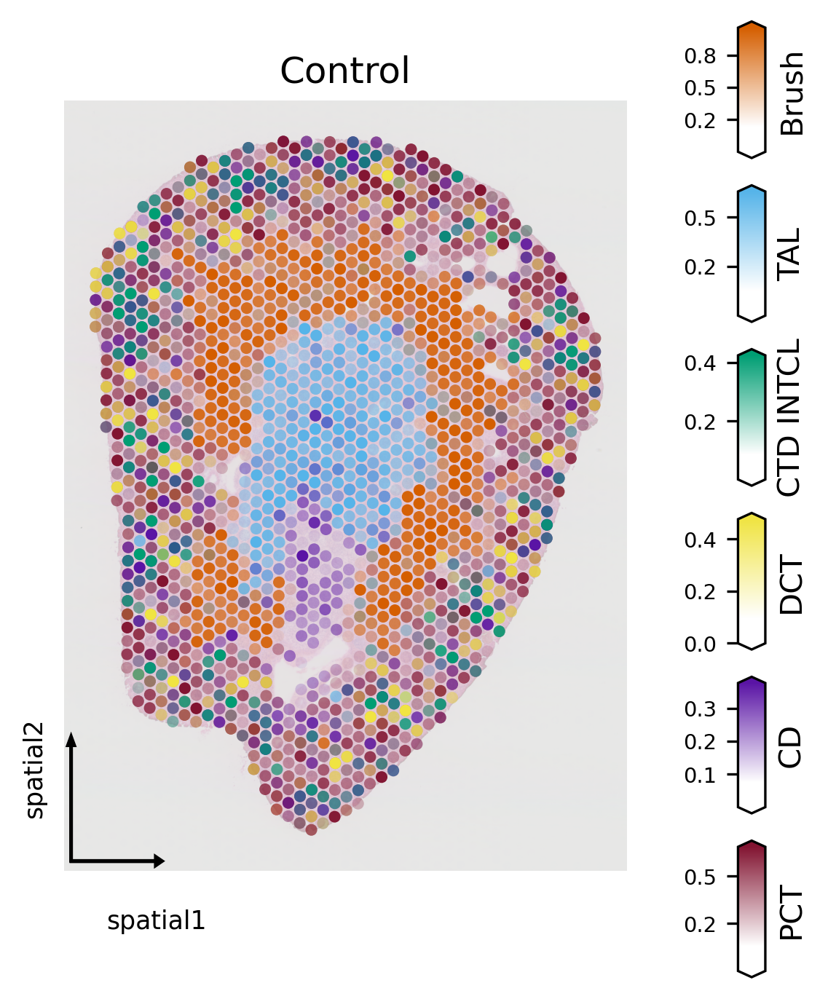

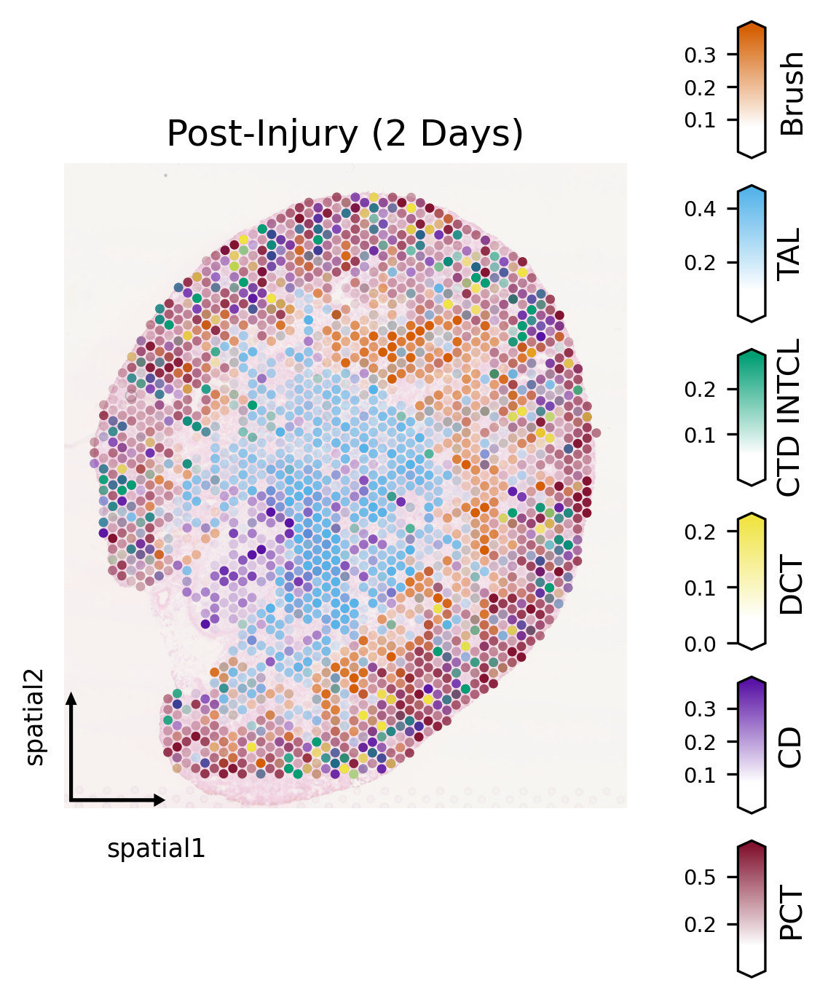

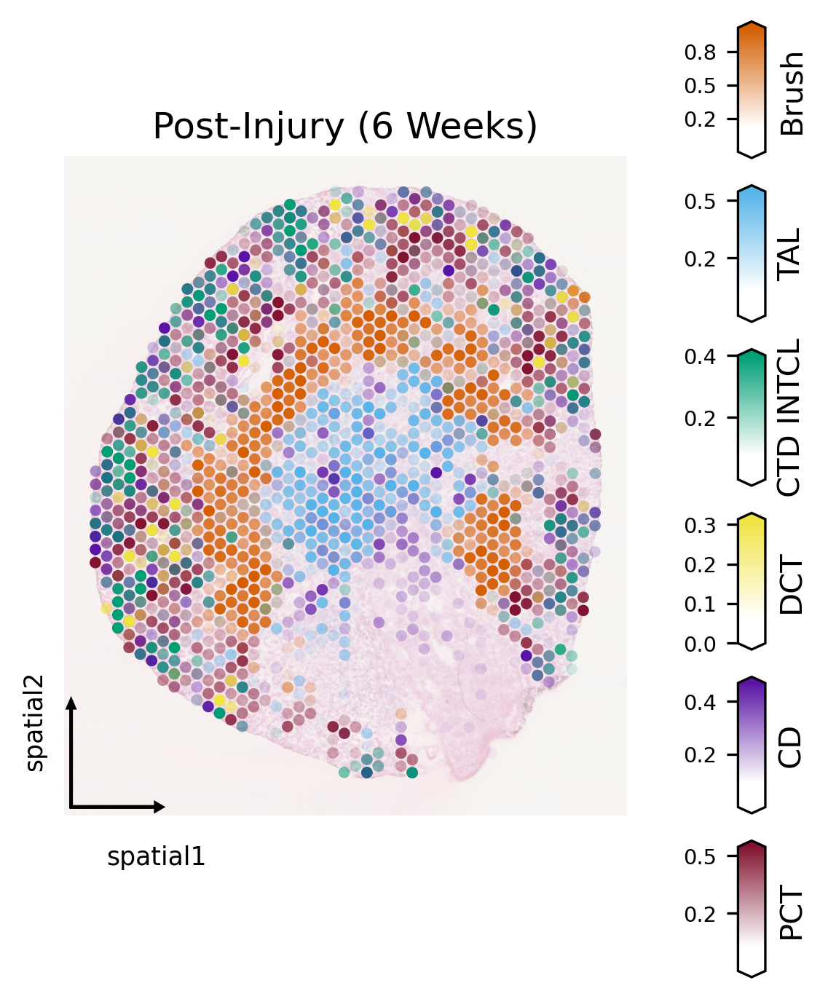

In [29]:
# Plot spatial kidney
ucd.pubscripts.fig3.plot_kidney_spatial(adata_ctrl, 'Control')
ucd.pubscripts.fig3.plot_kidney_spatial(adata_2d, title = 'Post-Injury (2 Days)')
ucd.pubscripts.fig3.plot_kidney_spatial(adata_6w, title = 'Post-Injury (6 Weeks)')

### Plot Cell Type Fraction Changes

In [43]:
import seaborn as sns
from statannotations.Annotator import Annotator
import textwrap
import matplotlib as mpl

In [44]:
def merge_over_time(celltype):
    df_ctrl = ucp_ctrl[[celltype]].copy(); df_ctrl['timepoint'] = 'Ctrl'
    df_4hr = ucp_4hr[[celltype]].copy(); df_4hr['timepoint'] = '4hr'
    df_12hr = ucp_12hr[[celltype]].copy(); df_12hr['timepoint'] = '12hr'
    df_2d= ucp_2d[[celltype]].copy(); df_2d['timepoint'] = '2d'
    df_6w = ucp_6w[[celltype]].copy(); df_6w['timepoint'] = '6w'
    
    
    df_merged = pd.concat([df_ctrl, df_4hr, df_12hr, df_2d, df_6w])
    
    return df_merged

(6, 4)
Ctrl vs. 12hr: Mann-Whitney-Wilcoxon test two-sided, P_val:8.832e-13 U_stat=5.738e+05
Ctrl vs. 2d: Mann-Whitney-Wilcoxon test two-sided, P_val:1.510e-02 U_stat=7.653e+05
Ctrl vs. 6w: Mann-Whitney-Wilcoxon test two-sided, P_val:5.406e-01 U_stat=4.633e+05
Ctrl vs. 12hr: Mann-Whitney-Wilcoxon test two-sided, P_val:4.246e-01 U_stat=1.530e+02
Ctrl vs. 2d: Mann-Whitney-Wilcoxon test two-sided, P_val:4.576e-02 U_stat=1.497e+03
Ctrl vs. 6w: Mann-Whitney-Wilcoxon test two-sided, P_val:7.311e-05 U_stat=1.330e+03
Ctrl vs. 12hr: Mann-Whitney-Wilcoxon test two-sided, P_val:8.268e-03 U_stat=2.176e+04
Ctrl vs. 2d: Mann-Whitney-Wilcoxon test two-sided, P_val:1.368e-13 U_stat=1.409e+05
Ctrl vs. 6w: Mann-Whitney-Wilcoxon test two-sided, P_val:2.738e-27 U_stat=8.438e+04
Ctrl vs. 12hr: Mann-Whitney-Wilcoxon test two-sided, P_val:2.537e-02 U_stat=4.508e+03
Ctrl vs. 2d: Mann-Whitney-Wilcoxon test two-sided, P_val:5.843e-01 U_stat=3.226e+03
Ctrl vs. 6w: Mann-Whitney-Wilcoxon test two-sided, P_val:1.05

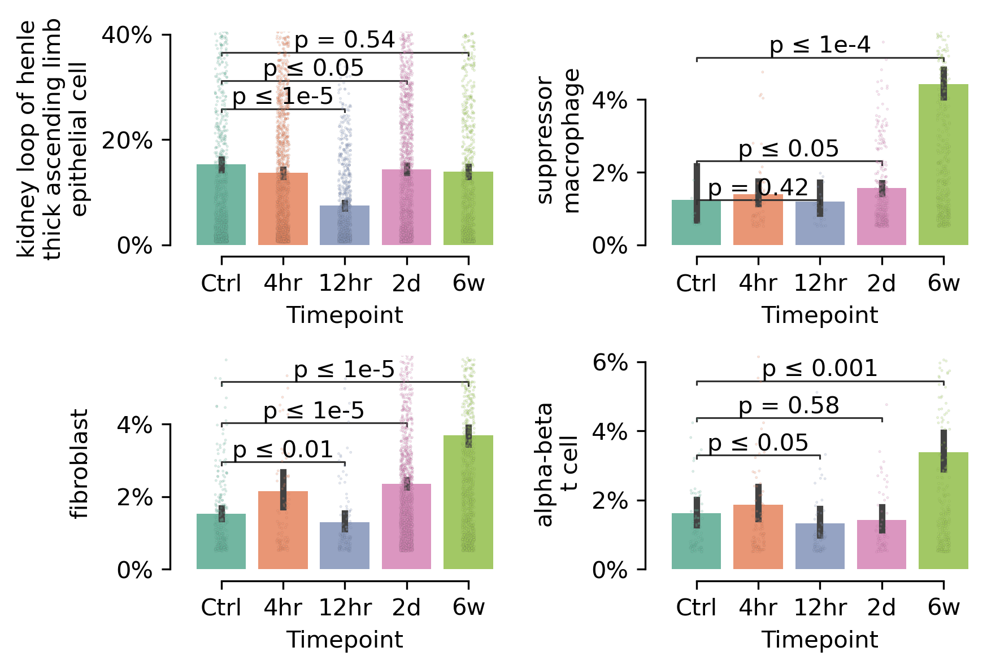

In [46]:
with ucd.pl.FigContext(rows=2, columns=2, figsize = (3,2), dpi = 300) as axes:
    
    # Define celltype labels to plot 
    celltype_labels = ['kidney loop of henle thick ascending limb epithelial cell',
                   'suppressor macrophage','fibroblast','alpha-beta t cell']
    
    fig = axes[0].get_figure()
    
    for ax,ct,maxy in zip(axes, celltype_labels, [0.25, 0.05, 0.05, 0.05]):
        df = merge_over_time(ct)
        df = df[df[ct].gt(0.005)]
        x = 'timepoint'
        y = ct
        order = ['Ctrl','4hr','12hr','2d','6w']
        pairs=[("Ctrl", "2d"),("Ctrl","6w"),('Ctrl',"12hr")]
        
        sns.barplot(data = df, x = 'timepoint', y = ct, ax = ax, order = order, 
                    palette = 'Set2', linewidth = 0.5)
        
        df_sub = df[df[ct].gt(0.005)]
        
        sns.stripplot(data = df_sub, x = 'timepoint', y = ct, ax = ax, order = order, 
                    palette = 'Set2', linewidth = 0.1, size = 1, alpha = 0.25)
        
        annotator = Annotator(ax, pairs, data=df, x=x, y=y, order=order)
        annotator.configure(test='Mann-Whitney', text_format='simple', loc='inside', show_test_name = False,
                           text_offset = 0, line_width = 0.75)
        
        ax.set_ylim(0, maxy)
        ax.set_xlabel('Timepoint')
        annotator.apply_and_annotate()
    
        
    sns.despine(fig, trim = True, offset = 5)
    
    for ax, w in zip(axes, [24,14,24,10]):
        ax.set_ylabel(textwrap.fill(ax.get_ylabel().lower(), w))
        ax.yaxis.set_major_formatter(mpl.ticker.PercentFormatter(1.0, 0))

    fig.align_ylabels()

## Show Specific Cell Type Changes

(5, 5)


/home/jupyter/github_repos/ucdeconvolve_old/ucdeconvolve/_plotting.py:133: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


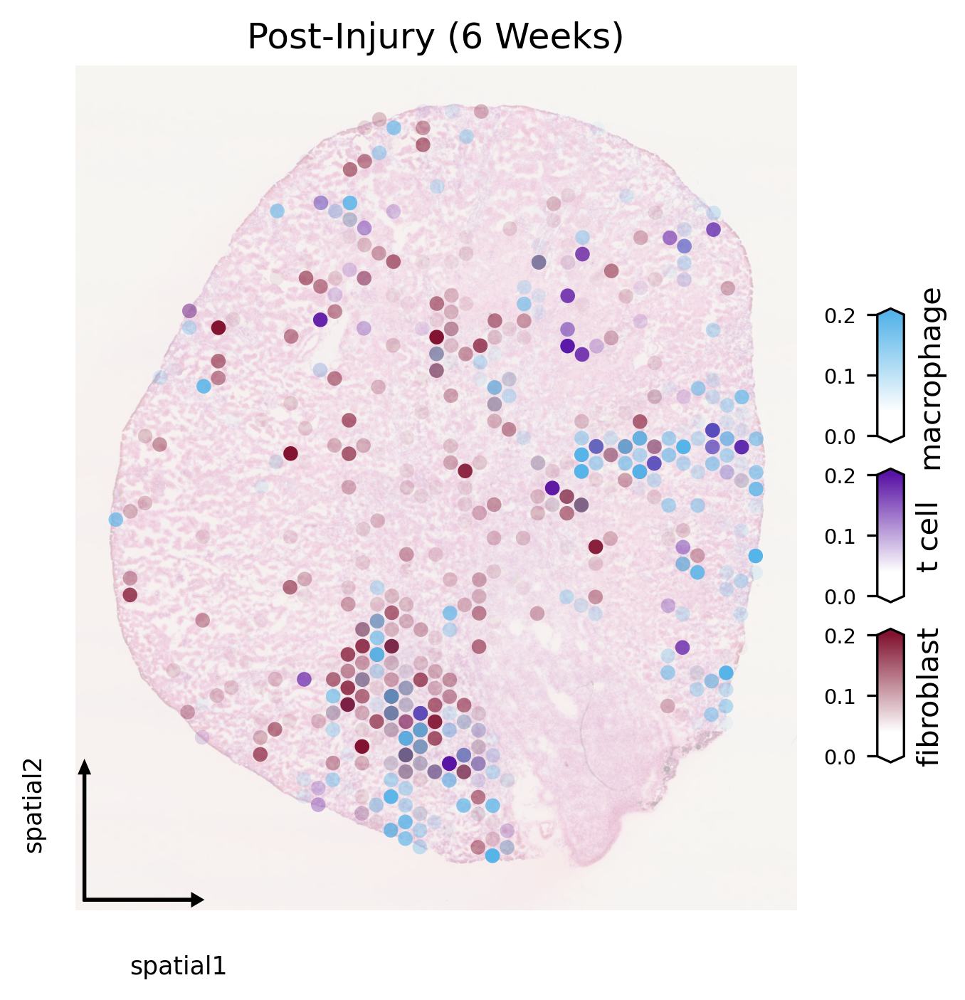

In [49]:
with ucd.pl.FigContext(figsize = (5,5), simple_axes = True, 
            simple_axes_padding=(6 * 0.0125), dpi = 300) as ax:
        
        fig = ax.get_figure()

        # Define color scheme to use
        colors = [ucd.pl.CM.Red, ucd.pl.CM.Purple,  ucd.pl.CM.Blue]

        # Define celltypes to plot
        celltypes = ['fibroblast', 
                     'alpha-beta t cell',
                    'suppressor macrophage']
        simple_names = ['Fibroblast', 'T Cell','Macrophage']
        title = 'Post-Injury (6 Weeks)'
        # Plot spatial organization
        for i, (celltype, cmap) in enumerate(zip(celltypes, colors)):
            ucd.pl.deconvolution(adata_6w, celltype, ax = ax, show = False, category = 'primary',
                                 spot_size = 120,
                cmap = cmap.value, alpha_img = 0.33 if i == 0 else 0.0, frameon = False,
                                vmax = 0.2, vmin = 0.0)

        ax.set_title(title)
        ax.invert_yaxis()

        # Define colorbar padding parameters
        startx, starty, height, pad = 0.825, 0.25, 0.125, 0.025

        # Append custom colorbar objects
        for collection, cmap, name in zip(ax.collections, colors, simple_names):
            collection.colorbar.ax.set_visible(False)

            ax_cbar = append_custom_cbar(fig, collection.colorbar, [startx,starty,0.025,0.125], 
                                         cmap.value, label = name.lower()) 

            ax_cbar.yaxis.set_ticks_position('left')
            ax_cbar.yaxis.set_major_formatter(mpl.ticker.FormatStrFormatter('%.1f'))
            ax_cbar.yaxis.set_tick_params(which='both', labelsize='x-small')
            starty += height + pad

(5, 5)


/home/jupyter/github_repos/ucdeconvolve_old/ucdeconvolve/_plotting.py:133: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


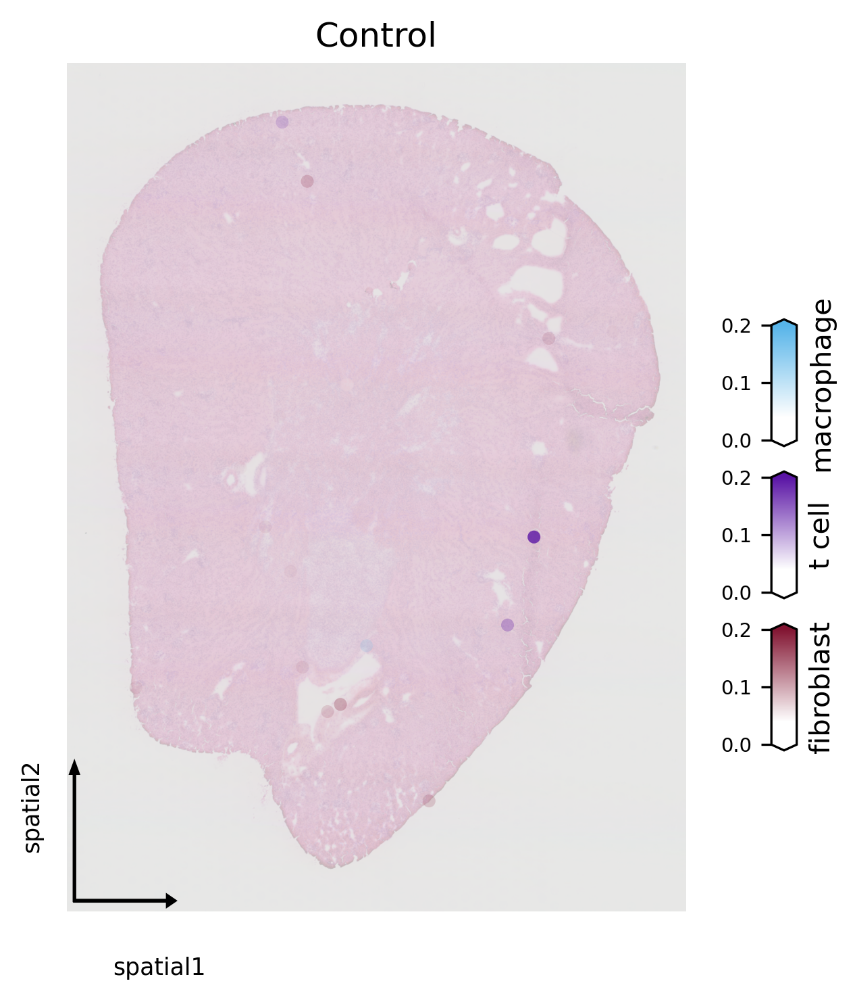

In [50]:
with ucd.pl.FigContext(figsize = (5,5), simple_axes = True, 
            simple_axes_padding=(6 * 0.0125), dpi = 300) as ax:
        
        fig = ax.get_figure()

        # Define color scheme to use
        colors = [ucd.pl.CM.Red, ucd.pl.CM.Purple,  ucd.pl.CM.Blue]

        # Define celltypes to plot
        celltypes = ['fibroblast', 
                     'alpha-beta t cell',
                    'suppressor macrophage']
        simple_names = ['Fibroblast', 'T Cell','Macrophage']
        title = 'Control'
        # Plot spatial organization
        for i, (celltype, cmap) in enumerate(zip(celltypes, colors)):
            ucd.pl.deconvolution(adata_ctrl, celltype, ax = ax, show = False, category = 'primary',
                                 spot_size = 120,
                cmap = cmap.value, alpha_img = 0.33 if i == 0 else 0.0, frameon = False,
                                vmax = 0.2, vmin = 0.0)

        ax.set_title(title)
        ax.invert_yaxis()
        # Define colorbar padding parameters
        startx, starty, height, pad = 0.825, 0.25, 0.125, 0.025

        # Append custom colorbar objects
        for collection, cmap, name in zip(ax.collections, colors, simple_names):
            collection.colorbar.ax.set_visible(False)

            ax_cbar = append_custom_cbar(fig, collection.colorbar, [startx,starty,0.025,0.125], 
                                         cmap.value, label = name.lower()) 

            ax_cbar.yaxis.set_ticks_position('left')
            ax_cbar.yaxis.set_major_formatter(mpl.ticker.FormatStrFormatter('%.1f'))
            ax_cbar.yaxis.set_tick_params(which='both', labelsize='x-small')
            starty += height + pad

### Compute Explanations For Key Cell Types

In [15]:
# CellTypes to Focus on
celltypes_to_explain_1 = ['kidney proximal convoluted tubule epithelial cell', 
             'kidney collecting duct epithelial cell',
             'kidney distal convoluted tubule epithelial cell', 
             'kidney collecting duct intercalated cell',
             'kidney loop of henle thick ascending limb epithelial cell',
             'brush cell']

celltypes_to_explain_2 = ['fibroblast', 'alpha-beta t cell', 'suppressor macrophage']

celltypes_to_explain_all = celltypes_to_explain_1 + celltypes_to_explain_2

In [107]:
# Generate explanations for celltypes above across each dataset (about 5 minutes per sample on T4, 1.5 min on V100)
expl_6w = ucd.tl.explain(adata_6w, celltypes_to_explain_all, basemodel, steps = 50, batchsize = 8)
expl_ctrl = ucd.tl.explain(adata_ctrl, celltypes_to_explain_all, basemodel, steps = 50, batchsize = 8)
expl_4hr = ucd.tl.explain(adata_4hr, celltypes_to_explain_all, basemodel, steps = 50, batchsize = 8)
expl_12hr = ucd.tl.explain(adata_12hr, celltypes_to_explain_all, basemodel, steps = 50, batchsize = 8)
expl_2d = ucd.tl.explain(adata_2d, celltypes_to_explain_all, basemodel, steps = 50, batchsize = 8)

Explaining Batches | 100% (199 of 199) |#| Elapsed Time: 0:01:22 Time:  0:01:22
Explaining Batches | 100% (202 of 202) |#| Elapsed Time: 0:01:22 Time:  0:01:22
Explaining Batches | 100% (277 of 277) |#| Elapsed Time: 0:01:52 Time:  0:01:52
Explaining Batches | 100% (236 of 236) |#| Elapsed Time: 0:01:37 Time:  0:01:37
Explaining Batches | 100% (276 of 276) |#| Elapsed Time: 0:01:51 Time:  0:01:51


In [ ]:
expl_ctrl.to_hdf(Path(DATAPATH,"results/explanations.h5"), key = 'ctrl', complevel = None)
expl_4hr.to_hdf(Path(DATAPATH,"results/explanations.h5"), key = '4hr', complevel = None)
expl_12hr.to_hdf(Path(DATAPATH,"results/explanations.h5"), key = '12hr', complevel = None)
expl_2d.to_hdf(Path(DATAPATH,"results/explanations.h5"), key = '2d', complevel = None)
expl_6w.to_hdf(Path(DATAPATH,"results/explanations.h5"), key = '6w', complevel = None)

### Load Explanations For Key Cell Types

In [5]:
expl_ctrl = pd.read_hdf(Path(DATAPATH,"results/explanations.h5"), key = 'ctrl')
expl_ctrl = expl_ctrl.astype(pd.SparseDtype(np.float32, 0.0))

expl_4hr = pd.read_hdf(Path(DATAPATH,"results/explanations.h5"), key = '4hr')
expl_4hr = expl_4hr.astype(pd.SparseDtype(np.float32, 0.0))

expl_12hr = pd.read_hdf(Path(DATAPATH,"results/explanations.h5"), key = '12hr')
expl_12hr = expl_12hr.astype(pd.SparseDtype(np.float32, 0.0))

expl_2d = pd.read_hdf(Path(DATAPATH,"results/explanations.h5"), key = '2d')
expl_2d = expl_2d.astype(pd.SparseDtype(np.float32, 0.0))

expl_6w = pd.read_hdf(Path(DATAPATH,"results/explanations.h5"), key = '6w')
expl_6w = expl_6w.astype(pd.SparseDtype(np.float32, 0.0))

In [183]:
expl_4hr = pd.read_hdf(Path(DATAPATH,"results/explanations.h5"), key = '4hr')
expl_4hr = expl_4hr.astype(pd.SparseDtype(np.float32, 0.0))

expl_12hr = pd.read_hdf(Path(DATAPATH,"results/explanations.h5"), key = '12hr')
expl_12hr = expl_12hr.astype(pd.SparseDtype(np.float32, 0.0))

expl_2d = pd.read_hdf(Path(DATAPATH,"results/explanations.h5"), key = '2d')
expl_2d = expl_2d.astype(pd.SparseDtype(np.float32, 0.0))

### Plot Explanations for Control State

(15.0, 5)


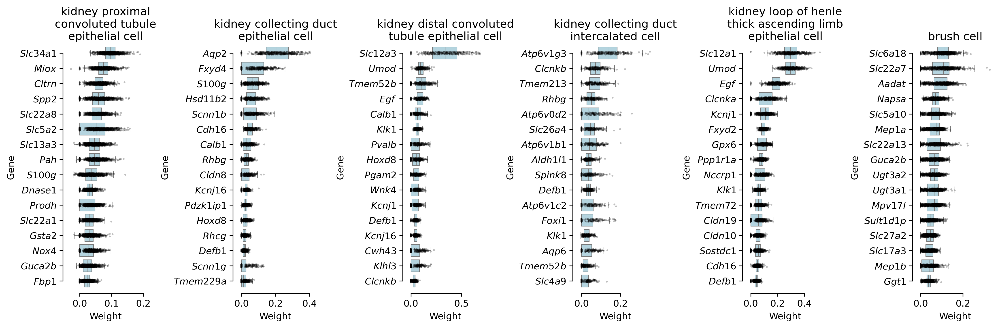

In [41]:
with ucd.pl.FigContext(rows = 1, columns = 6, figsize = (2.5,5), dpi = 300, despine = True) as axes:
    
    for ax, ct in zip(axes, celltypes_to_explain_1):
        ucd.pl.explain(expl_ctrl, ct, 
                       ucp_ctrl[ct].gt(0.1).pipe(lambda x:x[x]).index, ax = ax)
        
        # Format mouse gene symbols
        ticklabels_italics = []
        for ticklabel in ax.get_yticklabels():
            symbol = ticklabel.get_text()
            ticklabel.set_text(f"$\it{(symbol.lower().capitalize())}$")
            ticklabels_italics.append(ticklabel)
        ax.set_yticklabels(ticklabels_italics)

        ax.xaxis.set_major_formatter(mpl.ticker.FormatStrFormatter('%.1f'))
        ax.set_title(textwrap.fill(ax.get_title().lower(), 24))
        ax.set_xlabel('Weight')
        ax.set_ylabel('Gene')

(7.5, 2.5)


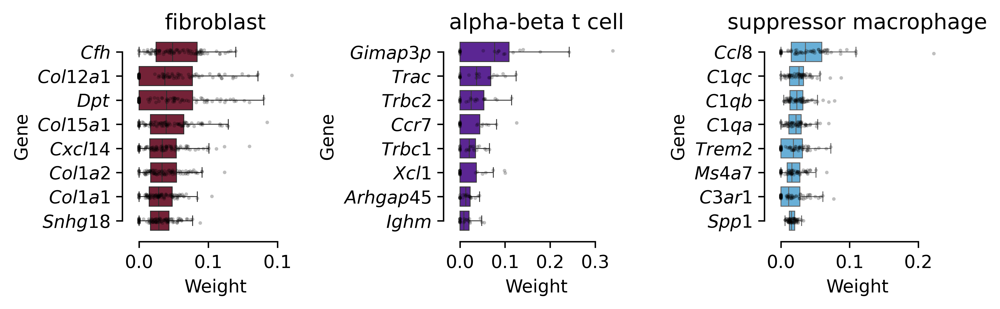

In [42]:
with ucd.pl.FigContext(rows = 1, columns = 3, figsize = (2.5,2.5), dpi = 600, despine = True) as axes:
    colors = [ucd.pl.CM.Red.value.get_over(), ucd.pl.CM.Purple.value.get_over(), ucd.pl.CM.Blue.value.get_over()]
    for ax, ct,color in zip(axes, celltypes_to_explain_2, colors):
        ucd.pl.explain(expl_6w, ct, ucp_6w[ct].gt(0.1).pipe(lambda x:x[x]).index, ax = ax, n_genes = 8, 
                      bar_color = color)
        
        # Format mouse gene symbols
        ticklabels_italics = []
        for ticklabel in ax.get_yticklabels():
            symbol = ticklabel.get_text()
            ticklabel.set_text(f"$\it{(symbol.lower().capitalize())}$")
            ticklabels_italics.append(ticklabel)
        ax.set_yticklabels(ticklabels_italics)
        
        ax.xaxis.set_major_formatter(mpl.ticker.FormatStrFormatter('%.1f'))
        ax.set_title(textwrap.fill(ax.get_title().lower(), 32))
        ax.set_xlabel('Weight')
        ax.set_ylabel('Gene')
        
        

In [31]:
ct = 'kidney proximal convoluted tubule epithelial cell'
n = 16
top_genes_ctrl = expl_ctrl.loc[ct].loc[ucp_ctrl[ct].gt(0.1)].mean(0).sort_values(ascending = False).head(n)
top_genes_6w = expl_6w.loc[ct].loc[ucp_6w[ct].gt(0.1)].mean(0).sort_values(ascending = False).head(n)
top_genes_2d = expl_2d.loc[ct].loc[ucp_2d[ct].gt(0.1)].mean(0).sort_values(ascending = False).head(n)
top_genes_12hr = expl_12hr.loc[ct].loc[ucp_12hr[ct].gt(0.1)].mean(0).sort_values(ascending = False).head(n)
top_genes_4hr = expl_4hr.loc[ct].loc[ucp_4hr[ct].gt(0.1)].mean(0).sort_values(ascending = False).head(n)

In [32]:
top_genes_merged = pd.concat([top_genes_ctrl, top_genes_4hr, top_genes_12hr, top_genes_2d, top_genes_6w], axis = 1).pipe(
    lambda df : pd.DataFrame(df.values, columns = ['Ctrl', '4hr','12hr', '2d', '6w'], index = df.index))
top_genes_merged = top_genes_merged.reindex(top_genes_merged.mean(1).sort_values(ascending = False).index)

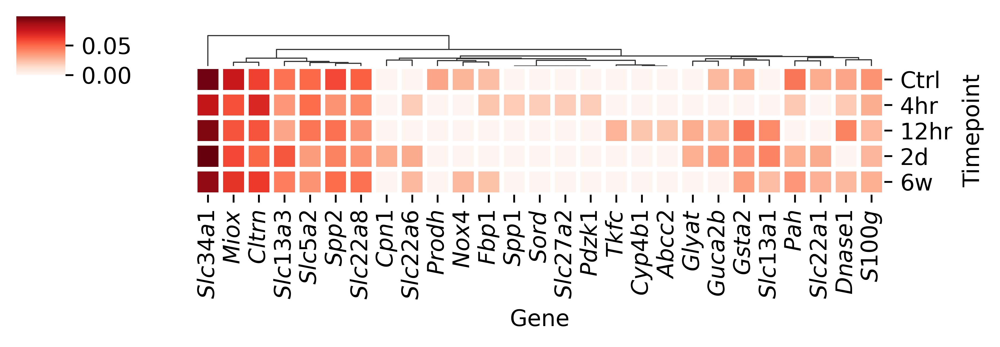

In [39]:
import seaborn as sns

g = sns.clustermap(top_genes_merged.fillna(0.0).T, yticklabels = True, col_cluster = True,
              figsize = (6, 2), cmap = 'Reds', linewidth = 2, dendrogram_ratio=0.2, row_cluster = False,
                  cbar_kws={"orientation":'vertical'}, xticklabels = True)
g.fig.set_dpi(600)
g.ax_heatmap.set_xlabel('Gene')
g.ax_heatmap.set_ylabel('Timepoint')

# Format mouse gene symbols
ticklabels_italics = []
for ticklabel in g.ax_heatmap.get_xticklabels():
    symbol = ticklabel.get_text()
    ticklabel.set_text(f"$\it{(symbol.lower().capitalize())}$")
    ticklabels_italics.append(ticklabel)

_ = g.ax_heatmap.set_xticklabels(ticklabels_italics)